# Hospital Mortality among Admitted Patients.

In [72]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns 
import plotly.express as px  # This Library provides functions to visualize a variety of types of data better than seaborn.
%matplotlib inline
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import add_dummy_feature
from sklearn.preprocessing import LabelEncoder, OrdinalEncoder
from tqdm import tqdm
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
si = SimpleImputer()
from pandas_profiling import ProfileReport 
import warnings
warnings.filterwarnings ('ignore')
from scipy.stats import skew

In [75]:
df = pd.read_csv('C:/Users/Gayatri/Downloads/Supervised_Kaustubh Kulkarni.csv')

In [74]:
df.head()

,encounter_id,patient_id,hospital_id,age,bmi,elective_surgery,ethnicity,gender,height,icu_admit_source,...,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,apache_2_bodysystem,Unnamed: 83,hospital_death
0,66154,25312,118,68.0,22.73,0,Caucasian,M,180.3,Floor,...,1.0,0.0,0.0,0.0,0.0,0.0,Sepsis,Cardiovascular,NaN,0
1,114252,59342,81,77.0,27.42,0,Caucasian,F,160.0,Floor,...,1.0,0.0,0.0,0.0,0.0,0.0,Respiratory,Respiratory,NaN,0
2,119783,50777,118,25.0,31.95,0,Caucasian,F,172.7,Accident & Emergency,...,0.0,0.0,0.0,0.0,0.0,0.0,Metabolic,Metabolic,NaN,0
3,79267,46918,118,81.0,22.64,1,Caucasian,F,165.1,Operating Room / Recovery,...,0.0,0.0,0.0,0.0,0.0,0.0,Cardiovascular,Cardiovascular,NaN,0
4,92056,34377,33,19.0,NaN,0,Caucasian,M,188.0,Accident & Emergency,...,0.0,0.0,0.0,0.0,0.0,0.0,Trauma,Trauma,NaN,0


In [4]:
df.shape

(91713, 85)

In [5]:
df = df.mask(df == '')
df.head(50)

,encounter_id,patient_id,hospital_id,age,bmi,elective_surgery,ethnicity,gender,height,icu_admit_source,...,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,apache_2_bodysystem,Unnamed: 83,hospital_death
0,66154,25312,118,68.0,22.730000,0,Caucasian,M,180.3,Floor,...,1.0,0.0,0.0,0.0,0.0,0.0,Sepsis,Cardiovascular,NaN,0
1,114252,59342,81,77.0,27.420000,0,Caucasian,F,160.0,Floor,...,1.0,0.0,0.0,0.0,0.0,0.0,Respiratory,Respiratory,NaN,0
2,119783,50777,118,25.0,31.950000,0,Caucasian,F,172.7,Accident & Emergency,...,0.0,0.0,0.0,0.0,0.0,0.0,Metabolic,Metabolic,NaN,0
3,79267,46918,118,81.0,22.640000,1,Caucasian,F,165.1,Operating Room / Recovery,...,0.0,0.0,0.0,0.0,0.0,0.0,Cardiovascular,Cardiovascular,NaN,0
4,92056,34377,33,19.0,NaN,0,Caucasian,M,188.0,Accident & Emergency,...,0.0,0.0,0.0,0.0,0.0,0.0,Trauma,Trauma,NaN,0
5,33181,74489,83,67.0,27.560000,0,Caucasian,M,190.5,Accident & Emergency,...,1.0,0.0,0.0,0.0,0.0,0.0,Neurological,Neurologic,NaN,0
6,82208,49526,83,59.0,57.450000,0,Caucasian,F,165.1,Accident & Emergency,...,1.0,0.0,0.0,0.0,0.0,0.0,Respiratory,Respiratory,NaN,0
7,120995,50129,33,70.0,NaN,0,Caucasian,M,165.0,Accident & Emergency,...,0.0,0.0,1.0,0.0,0.0,0.0,Sepsis,Cardiovascular,NaN,0
8,80471,10577,118,45.0,NaN,0,Caucasian,M,170.2,Other Hospital,...,0.0,0.0,0.0,0.0,0.0,0.0,Cardiovascular,Cardiovascular,NaN,1
9,42871,90749,118,50.0,25.710000,0,NaN,M,175.3,Accident & Emergency,...,0.0,0.0,0.0,0.0,0.0,0.0,Cardiovascular,Cardiovascular,NaN,0


In [6]:
# As these columns are independent values, we can remove them to reduce dataframe size
df.drop(['encounter_id', 'icu_admit_source', 'icu_id', 'icu_stay_type', 'patient_id', 'hospital_id','Unnamed: 83'], axis=1,inplace = True)

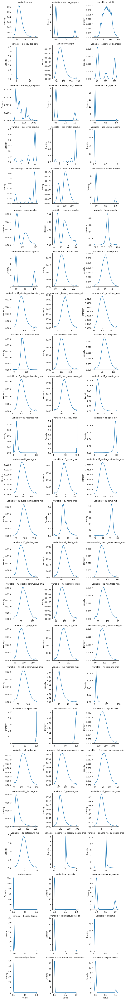

In [7]:
unpivot = pd.melt(df, df.describe().columns[0], df.describe().columns[1:])

g = sns.FacetGrid(unpivot, col="variable", col_wrap=3, sharex=False, sharey=False)
g.map(sns.kdeplot, "value")

plt.show()


**The death rate for Male-Female patients is shown below. While the rate of female deaths are higher the youngest person to pass away during one of the case was a Male of 16yrs of age**

In [8]:
fig = px.histogram(df[['age','gender','hospital_death','bmi']].dropna(), x="age", y="hospital_death", color="gender",
                   marginal="box", # or violin, rug, box
                   hover_data=df[['age','gender','hospital_death','bmi']].columns)
fig.show()

In [48]:
ICU_type=df[['icu_type','age','hospital_death']]
ICU_type['icu_type']=ICU_type['icu_type'].replace({'CTICU':'CCU-CTICU',
                                              'Cardiac ICU':'CCT-CTICU',
                                              'CTICU':'CCT-CTICU',
                                              'CSICU':'SICU'})
#ICU_type['pre_icu_los_days']=ICU_type['pre_icu_los_days'].round(0)
ICU_df=ICU_type.groupby(['icu_type','age']).mean().reset_index()
ICU_df['count']=ICU_type.groupby(['icu_type','age']).count().reset_index()['hospital_death']

In [49]:
ICU_type.value_counts() # Lets see which types of ICU are present

icu_type      age   hospital_death
Med-Surg ICU  67.0  0                 1035
              68.0  0                 1022
              66.0  0                 1015
              72.0  0                 1003
              71.0  0                  998
                                      ... 
CCU-CTICU     22.0  1                    1
Neuro ICU     23.0  1                    1
              25.0  1                    1
MICU          19.0  1                    1
Neuro ICU     29.0  1                    1
Length: 843, dtype: int64

In [50]:
df['hospital_death'].value_counts() # Total Deaths among all ICU types = 1

0    83798
1     7915
Name: hospital_death, dtype: int64

**Lets Plot a chart to see death ratio in detail**

In [51]:
fig = px.scatter(ICU_df, x="age", y="hospital_death", size="count", color="icu_type",
           hover_name="icu_type", log_x=False, size_max=60,)
fig.update_layout(
    title_text="Death rate at different types of ICU"
)
fig.update_yaxes(title_text="Average Hospital Death")
fig.update_xaxes(title_text="Age")
fig.show()

**Above chart shows that Mid-Surgical ICU have maximum death count. Now let's get bar plot for same.**

In [10]:
fig = px.bar(ICU_df, x="age", y="hospital_death", color="icu_type",
           hover_name="icu_type", log_x=False,)
fig.update_layout(
    title_text="Death rate at different types of ICU"
)
fig.update_yaxes(title_text="Average Hospital Death")
fig.update_xaxes(title_text="Age")
fig.show()

In [11]:
df_num = [                             # This is to seperate numerical variables from categorical variables
 'elective_surgery',
 'apache_post_operative',
 'arf_apache',
 'gcs_unable_apache',
 'intubated_apache',
 'ventilated_apache',
 'aids',
 'cirrhosis',
 'diabetes_mellitus',
 'hepatic_failure',
 'immunosuppression',
 'leukemia',
 'lymphoma',
 'solid_tumor_with_metastasis']

df_cat = ['ethnicity',
 'gender',
 'icu_type',
 'apache_3j_bodysystem',
 'apache_2_bodysystem']

In [52]:
df.nunique()[df.nunique() == 2].index.tolist() # This will show the unique values of each column but don't convert it. 

['elective_surgery',
 'gender',
 'apache_post_operative',
 'arf_apache',
 'gcs_unable_apache',
 'intubated_apache',
 'ventilated_apache',
 'aids',
 'cirrhosis',
 'diabetes_mellitus',
 'hepatic_failure',
 'immunosuppression',
 'leukemia',
 'lymphoma',
 'solid_tumor_with_metastasis',
 'hospital_death']

In [13]:
df.select_dtypes(include='O').columns.values.tolist()

['ethnicity',
 'gender',
 'icu_type',
 'apache_3j_bodysystem',
 'apache_2_bodysystem']

In [53]:
not_numeric = df[df_num + df_cat + ['hospital_death']].columns.tolist() # This will return only Numeric column
numeric_only = df.drop(not_numeric,axis=1).columns.tolist()
numeric_only

['age',
 'bmi',
 'height',
 'pre_icu_los_days',
 'weight',
 'apache_2_diagnosis',
 'apache_3j_diagnosis',
 'gcs_eyes_apache',
 'gcs_motor_apache',
 'gcs_verbal_apache',
 'heart_rate_apache',
 'map_apache',
 'resprate_apache',
 'temp_apache',
 'd1_diasbp_max',
 'd1_diasbp_min',
 'd1_diasbp_noninvasive_max',
 'd1_diasbp_noninvasive_min',
 'd1_heartrate_max',
 'd1_heartrate_min',
 'd1_mbp_max',
 'd1_mbp_min',
 'd1_mbp_noninvasive_max',
 'd1_mbp_noninvasive_min',
 'd1_resprate_max',
 'd1_resprate_min',
 'd1_spo2_max',
 'd1_spo2_min',
 'd1_sysbp_max',
 'd1_sysbp_min',
 'd1_sysbp_noninvasive_max',
 'd1_sysbp_noninvasive_min',
 'd1_temp_max',
 'd1_temp_min',
 'h1_diasbp_max',
 'h1_diasbp_min',
 'h1_diasbp_noninvasive_max',
 'h1_diasbp_noninvasive_min',
 'h1_heartrate_max',
 'h1_heartrate_min',
 'h1_mbp_max',
 'h1_mbp_min',
 'h1_mbp_noninvasive_max',
 'h1_mbp_noninvasive_min',
 'h1_resprate_max',
 'h1_resprate_min',
 'h1_spo2_max',
 'h1_spo2_min',
 'h1_sysbp_max',
 'h1_sysbp_min',
 'h1_sysbp_n

In [56]:
for col in df_num:                      # Let's put for loop to fill all null values in Categorical column of dataset with MODE
    df[col] = df[col].astype('Int64')
    
for col in df_cat:
    df[col] = df[col].fillna(df[col].mode()[0]) 

In [16]:
df.head(50)

,age,bmi,elective_surgery,ethnicity,gender,height,icu_type,pre_icu_los_days,weight,apache_2_diagnosis,...,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,apache_2_bodysystem,hospital_death
0,68.0,22.730000,0,Caucasian,M,180.3,CTICU,0.541667,73.9,113.0,...,0,1,0,0,0,0,0,Sepsis,Cardiovascular,0
1,77.0,27.420000,0,Caucasian,F,160.0,Med-Surg ICU,0.927778,70.2,108.0,...,0,1,0,0,0,0,0,Respiratory,Respiratory,0
2,25.0,31.950000,0,Caucasian,F,172.7,Med-Surg ICU,0.000694,95.3,122.0,...,0,0,0,0,0,0,0,Metabolic,Metabolic,0
3,81.0,22.640000,1,Caucasian,F,165.1,CTICU,0.000694,61.7,203.0,...,0,0,0,0,0,0,0,Cardiovascular,Cardiovascular,0
4,19.0,NaN,0,Caucasian,M,188.0,Med-Surg ICU,0.073611,NaN,119.0,...,0,0,0,0,0,0,0,Trauma,Trauma,0
5,67.0,27.560000,0,Caucasian,M,190.5,Med-Surg ICU,0.000694,100.0,301.0,...,0,1,0,0,0,0,0,Neurological,Neurologic,0
6,59.0,57.450000,0,Caucasian,F,165.1,Med-Surg ICU,0.000694,156.6,108.0,...,0,1,0,0,0,0,0,Respiratory,Respiratory,0
7,70.0,NaN,0,Caucasian,M,165.0,Med-Surg ICU,0.002083,NaN,113.0,...,0,0,0,1,0,0,0,Sepsis,Cardiovascular,0
8,45.0,NaN,0,Caucasian,M,170.2,CCU-CTICU,0.009028,NaN,116.0,...,0,0,0,0,0,0,0,Cardiovascular,Cardiovascular,1
9,50.0,25.710000,0,Caucasian,M,175.3,CCU-CTICU,0.060417,79.0,112.0,...,0,0,0,0,0,0,0,Cardiovascular,Cardiovascular,0


In [17]:
df.shape

(91713, 78)

In [57]:
df[numeric_only].isna().sum(axis=0).sort_values(ascending=False) # Let's sort Null values of Numerical column as well

d1_potassium_min                 9585
d1_potassium_max                 9585
h1_mbp_noninvasive_min           9084
h1_mbp_noninvasive_max           9084
apache_4a_icu_death_prob         7947
apache_4a_hospital_death_prob    7947
h1_diasbp_noninvasive_max        7350
h1_diasbp_noninvasive_min        7350
h1_sysbp_noninvasive_min         7341
h1_sysbp_noninvasive_max         7341
d1_glucose_min                   5807
d1_glucose_max                   5807
h1_mbp_min                       4639
h1_mbp_max                       4639
h1_resprate_min                  4357
h1_resprate_max                  4357
age                              4228
h1_spo2_min                      4185
h1_spo2_max                      4185
temp_apache                      4108
h1_diasbp_max                    3619
h1_diasbp_min                    3619
h1_sysbp_min                     3611
h1_sysbp_max                     3611
bmi                              3429
h1_heartrate_min                 2790
h1_heartrate

**Let's Split the numeric data columns to drop Null values which are more than 11000** 

In [19]:
split_one = df[numeric_only].isna().sum(axis=0).sort_values()[df[numeric_only].isna().sum(axis=0) < 11000].index.tolist()
split_two = df[numeric_only].isna().sum(axis=0).sort_values()[df[numeric_only].isna().sum(axis=0) > 11000].index.tolist()

In [20]:
for col in split_two:
    df[col] = df[col].fillna(df[col].mean())

process_data = df.dropna(axis=0)

In [21]:
process_data[df_cat].nunique()

ethnicity                6
gender                   2
icu_type                 8
apache_3j_bodysystem    11
apache_2_bodysystem     10
dtype: int64

**Using get_dummies to convert categorical data into indicator variables**

In [22]:
icu_data = pd.get_dummies(process_data,
    prefix='isin',
    prefix_sep='_',
    columns=df_cat,
    drop_first=False)
icu_data.reset_index(drop = True, inplace = True)
icu_data

,age,bmi,elective_surgery,height,pre_icu_los_days,weight,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,...,isin_Cardiovascular,isin_Gastrointestinal,isin_Haematologic,isin_Metabolic,isin_Neurologic,isin_Renal/Genitourinary,isin_Respiratory,isin_Trauma,isin_Undefined Diagnoses,isin_Undefined diagnoses
0,68.0,22.730000,0,180.3,0.541667,73.9,113.0,502.01,0,0,...,1,0,0,0,0,0,0,0,0,0
1,77.0,27.420000,0,160.0,0.927778,70.2,108.0,203.01,0,0,...,0,0,0,0,0,0,1,0,0,0
2,67.0,27.560000,0,190.5,0.000694,100.0,301.0,403.01,0,0,...,0,0,0,0,1,0,0,0,0,0
3,50.0,25.710000,0,175.3,0.060417,79.0,112.0,107.01,0,0,...,1,0,0,0,0,0,0,0,0,0
4,72.0,28.257052,1,154.9,0.004861,67.8,303.0,1304.08,1,0,...,0,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57593,47.0,51.439842,1,195.0,0.033333,186.0,304.0,1406.01,1,0,...,0,1,0,0,0,0,0,0,0,0
57594,54.0,19.770448,0,177.8,0.025694,62.5,109.0,108.01,0,0,...,1,0,0,0,0,0,0,0,0,0
57595,75.0,23.060250,0,177.8,0.298611,72.9,113.0,501.06,0,0,...,1,0,0,0,0,0,0,0,0,0
57596,56.0,47.179671,0,183.0,0.120139,158.0,113.0,501.05,0,0,...,1,0,0,0,0,0,0,0,0,0


In [60]:
icu_data.columns = [x.lower() for x in icu_data.columns.tolist()] # Get duplicate values
icu_data = icu_data.loc[:,~icu_data.columns.duplicated()] 

In [58]:
t = icu_data['arf_apache'].dtype       # Here i use tqdm to see Progress Bar because of time consumption in data processing
for col in tqdm(icu_data.columns.tolist()):
    if icu_data[col].values.dtype == 'uint8' or t == icu_data[col].values.dtype:
        icu_data[col] = icu_data[col].astype(int)

100%|███████████████████████████████████████████████████████████████████████████████| 104/104 [00:00<00:00, 178.69it/s]


In [61]:
icu_data.dtypes          # Let's check datatypes in Numerical Columns

age                         float64
bmi                         float64
elective_surgery              int32
height                      float64
pre_icu_los_days            float64
                             ...   
isin_trauma                   int32
isin_haematologic             int32
isin_neurologic               int32
isin_renal/genitourinary      int32
isin_undefined diagnoses      int32
Length: 104, dtype: object

**let's Split The data into Train and Test set for Model building**

In [62]:
x = icu_data.drop(['hospital_death'], axis=1)      # Have to add in between columns also in 'x' 
y = icu_data['hospital_death'] 
x1 = x[['apache_4a_hospital_death_prob','apache_4a_icu_death_prob','age','d1_spo2_min','d1_resprate_max','d1_heartrate_min']]
xtrain,xtest,ytrain,ytest = train_test_split(x1,y,test_size=0.30,random_state=1)

In [27]:
print(xtrain.shape)
print(ytrain.shape)

(40318, 6)
(40318,)


In [59]:
def mymodel(model):             # this is function to check each and every algorithm on model
    model.fit(xtrain,ytrain)
    ypred = model.predict(xtest)
    
    train = model.score(xtrain,ytrain)
    test = model.score(xtest,ytest)
    
    print(f"training accuracy is {train}\nTesting accuracy is:{test}")
    print (classification_report(ytest,ypred))

In [29]:
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix, precision_score, recall_score, classification_report

In [63]:
sv = mymodel(SVC()) # Accuracy is Good but let's get maximum.

training accuracy is 0.9152735750781289
Testing accuracy is:0.9173032407407408
              precision    recall  f1-score   support

           0       0.92      1.00      0.96     15814
           1       0.95      0.03      0.05      1466

    accuracy                           0.92     17280
   macro avg       0.93      0.51      0.50     17280
weighted avg       0.92      0.92      0.88     17280



In [31]:
lg = mymodel(LogisticRegression())

training accuracy is 0.9222679696413513
Testing accuracy is:0.9231481481481482
              precision    recall  f1-score   support

           0       0.93      0.99      0.96     15814
           1       0.63      0.23      0.33      1466

    accuracy                           0.92     17280
   macro avg       0.78      0.61      0.65     17280
weighted avg       0.91      0.92      0.91     17280



In [32]:
kn = mymodel(KNeighborsClassifier())

training accuracy is 0.9216727020189494
Testing accuracy is:0.9107638888888889
              precision    recall  f1-score   support

           0       0.92      0.99      0.95     15814
           1       0.39      0.09      0.15      1466

    accuracy                           0.91     17280
   macro avg       0.66      0.54      0.55     17280
weighted avg       0.88      0.91      0.88     17280



In [33]:
ad = mymodel(AdaBoostClassifier())

training accuracy is 0.9243018006845578
Testing accuracy is:0.9241898148148148
              precision    recall  f1-score   support

           0       0.94      0.99      0.96     15814
           1       0.63      0.26      0.37      1466

    accuracy                           0.92     17280
   macro avg       0.78      0.62      0.67     17280
weighted avg       0.91      0.92      0.91     17280



In [34]:
gd = mymodel(GradientBoostingClassifier())

training accuracy is 0.9272533359789672
Testing accuracy is:0.9251736111111111
              precision    recall  f1-score   support

           0       0.93      0.99      0.96     15814
           1       0.66      0.25      0.36      1466

    accuracy                           0.93     17280
   macro avg       0.79      0.62      0.66     17280
weighted avg       0.91      0.93      0.91     17280



In [35]:
xg = mymodel(XGBClassifier()) # Best Accuracy Score so far

training accuracy is 0.9473188154174315
Testing accuracy is:0.9223958333333333
              precision    recall  f1-score   support

           0       0.93      0.98      0.96     15814
           1       0.60      0.26      0.36      1466

    accuracy                           0.92     17280
   macro avg       0.77      0.62      0.66     17280
weighted avg       0.91      0.92      0.91     17280

